# Playing with Sentinel 3 through EUMetsat's API

# Table of Contents
* [Getting started](#gettingstarted)
* [Masking and plotting L2 data](#maskplot)
* [Searching the collection](#search)
* [Production scale L2](#production)


# Useful links getting started <a class="anchor" id="gettingstarted"></a>

https://user.eumetsat.int/resources/user-guides/getting-started-using-data

https://gitlab.eumetsat.int/eumetlab/data-services/eumdac_data_store/-/blob/master/4_EUMDAC-Cookbook.ipynb

## Follow API instructions here...

Cell 5 of this notebook 

https://gitlab.eumetsat.int/eumetlab/oceans/ocean-training/sensors/learn-slstr/-/blob/main/1_SLSTR_introductory/1_1a_SLSTR_data_access_Data_Store.ipynb

## License required 

In addition to the login, you also require a license. 


In [1]:
# !pip install eumdac



# Simple install

In [2]:
 # Import the library EUMDAC
import configparser      # a library that allows us to parse standard configuration files
import IPython           # a library that helps us display video and HTML content
import os                # a library that allows us access to basic operating system commands like making directories
import shutil            # a library that allows us access to basic operating system commands like copy
import zipfile           # a library that allows us to unzip zip-files.
import eumdac            # a tool that helps us download via the eumetsat/data-store
from pathlib import Path # a library that helps construct system path objects
import getpass           # a library to help us enter passwords

import requests, os

consumer_key = 'CONSUMER-KEY'
consumer_secret = 'CONSUMER-SECRET'

def login():
    cred_file = '/home/andrew/eumetsat_api_credentials.txt'
    # os.path.exists(cred_file)

    with open(cred_file, 'r') as f:
        lines = f.readlines()
        consumer_key = lines[2].strip()
        consumer_secret = lines[3].strip()

    # Insert your personal key and secret into the single quotes

    credentials = (consumer_key, consumer_secret)

    token = eumdac.AccessToken(credentials)

    try:
        print(f"This token '{token}' expires {token.expiration}")
    except requests.exceptions.HTTPError as error:
        print(f"Error when tryng the request to the server: '{error}'")

    return token

token = login()


This token '0943b3e1-1acf-324b-b3a5-5fac9c443241' expires 2025-06-07 11:33:56.448869


## Use the module for simplicity

In [3]:
import eumetsat_tools_uwa

token = eumetsat_tools_uwa.login()


This token '0943b3e1-1acf-324b-b3a5-5fac9c443241' expires 2025-06-07 11:33:56.467136


 We need a number of SLSTR level-1b and level-2 products for the notebooks within the introductory part of the learn-slstr module. These products are shown below in a python list called product list. We can retrieve these products from either the Data Store or the WEkEO product catalogue.

In [4]:
product_list = [
'S3A_SL_1_RBT____20220209T225750_20220209T230050_20220211T073550_0179_082_001_3600_MAR_O_NT_004.SEN3',
'S3A_SL_1_RBT____20220209T220650_20220209T220950_20220211T045404_0179_082_001_0540_MAR_O_NT_004.SEN3',
'S3A_SL_2_WST____20220209T213232_20220209T231332_20220211T074946_6059_081_385______MAR_O_NT_003.SEN3'
]

 Now we have a token, we can create an instance of the EUMETSAT Data Store.

In [5]:
# Retrieve how many collection objects are available from DataStore
datastore = eumdac.DataStore(token)


 Data in the EUMETSAT Data Store are stored as collections, each with its own ID. If we don't know our collection ID a priori, we can find this information via the Data Store GUI or by asking `eumdac` to tell us about all available relevant collections as follows:

In [6]:
for collection_id in datastore.collections:
    if ("SLSTR" in collection_id.title):
        if "non-public" in collection_id.abstract: continue
        print(f"Collection ID({collection_id}): {collection_id.title}")

Collection ID(EO:EUM:DAT:0411): SLSTR Level 1B Radiances and Brightness Temperatures - Sentinel-3
Collection ID(EO:EUM:DAT:0412): SLSTR Level 2 Sea Surface Temperature (SST) - Sentinel-3
Collection ID(EO:EUM:DAT:0416): SLSTR Level 2 Aerosol Optical Depth - Sentinel-3
Collection ID(EO:EUM:DAT:0417): SLSTR Level 2 Fire Radiative Power - Sentinel 3
Collection ID(EO:EUM:DAT:0582): SLSTR Level 2 Sea Surface Temperature (SST) (version BC003) - Sentinel-3 - Reprocessed
Collection ID(EO:EUM:DAT:0581): SLSTR Level 1B Radiances and Brightness Temperatures (version BC003) - Sentinel-3 - Reprocessed
Collection ID(EO:EUM:DAT:0615): SLSTR Level 1B Radiances and Brightness Temperatures (version BC004) - Sentinel-3 - Reprocessed


So, for;
- SLSTR Level 1B Radiances and Brightness Temperatures we want collection_id: EO:EUM:DAT:0411.
- SLSTR Level 2 Sea Surface Temperature (SST) we want collection_id: EO:EUM:DAT:0412
 
 
Lets get some level-1B data first. Below we provide the level-1B collection_id to our datastore object to choose the correct collection.

In [9]:
collection_id = 'EO:EUM:DAT:0411'
selected_collection = datastore.get_collection(collection_id)

 In this case, as we already know what product we want, we can now find the product directly using the product name. which in this case the first item in our product list.

In [10]:
selected_product = datastore.get_product(product_id=product_list[0], collection_id=collection_id)



 For more advanced search options using EUMDAC see the notebook on advanced data access with eumdac [https://gitlab.eumetsat.int/eumetlab/oceans/ocean-training/sensors/learn-slstr/-/tree/main]. 
 
Now we can download the product. It will go into our download directory (../products).

In [11]:
with selected_product.open() as fsrc:
    pass

In [12]:
download_dir = '../DATA'

with selected_product.open() as fsrc, open(os.path.join(download_dir, fsrc.name), mode='wb') as fdst:
    print(f'Downloading {fsrc.name}')
    shutil.copyfileobj(fsrc, fdst)
    print(f'Download of product {fsrc.name} finished.')


Download of product S3A_SL_1_RBT____20220209T225750_20220209T230050_20220211T073550_0179_082_001_3600_MAR_O_NT_004.SEN3.zip finished.


 The product is downloaded as a zip file, so lets unzip it and remove the zip.

In [13]:

with zipfile.ZipFile(fdst.name, 'r') as zip_ref:
    for file in zip_ref.namelist():
        if file.startswith(str(selected_product)):
            zip_ref.extract(file, download_dir)
    print(f'Unzipping of product {selected_product} finished.')
    
os.remove(fdst.name)

Unzipping of product S3A_SL_1_RBT____20220209T225750_20220209T230050_20220211T073550_0179_082_001_3600_MAR_O_NT_004.SEN3 finished.


 You can now check the products directory to see that we have the level 1B file. Now, lets pull all the parts together and download the second level-1 and the level 2 file in a single loop.

In [14]:
collection_ids = ["EO:EUM:DAT:0411", "EO:EUM:DAT:0412"]

for product_id, collection_id in zip(product_list[1:],collection_ids):
    print(f"Retrieving: {product_id}")    

    selected_collection = datastore.get_collection(collection_id)
    selected_product = datastore.get_product(product_id=product_id, collection_id=collection_id)
    
    with selected_product.open() as fsrc, open(os.path.join(download_dir, fsrc.name), mode='wb') as fdst:
        print(f'Downloading {fsrc.name}.')
        shutil.copyfileobj(fsrc, fdst)
        print(f'Download of product {fsrc.name} finished.')

    with zipfile.ZipFile(fdst.name, 'r') as zip_ref:
        for file in zip_ref.namelist():
            if file.startswith(str(selected_product)):
                zip_ref.extract(file, download_dir)
        print(f'Unzipping of product {fdst.name} finished.')

    os.remove(fdst.name)

Retrieving: S3A_SL_1_RBT____20220209T220650_20220209T220950_20220211T045404_0179_082_001_0540_MAR_O_NT_004.SEN3
Download of product S3A_SL_1_RBT____20220209T220650_20220209T220950_20220211T045404_0179_082_001_0540_MAR_O_NT_004.SEN3.zip finished.
Unzipping of product ../DATA/S3A_SL_1_RBT____20220209T220650_20220209T220950_20220211T045404_0179_082_001_0540_MAR_O_NT_004.SEN3.zip finished.
Retrieving: S3A_SL_2_WST____20220209T213232_20220209T231332_20220211T074946_6059_081_385______MAR_O_NT_003.SEN3
Download of product S3A_SL_2_WST____20220209T213232_20220209T231332_20220211T074946_6059_081_385______MAR_O_NT_003.SEN3.zip finished.
Unzipping of product ../DATA/S3A_SL_2_WST____20220209T213232_20220209T231332_20220211T074946_6059_081_385______MAR_O_NT_003.SEN3.zip finished.


## That's it for data access

Now onto the SST data notebook https://gitlab.eumetsat.int/eumetlab/oceans/ocean-training/sensors/learn-slstr/-/blob/main/1_SLSTR_introductory/1_6_SLSTR_SST.ipynb 

# Masking and plotting <a class="anchor" id="maskplot"></a>

Get `eumartools` for image masking 

https://gitlab.com/benloveday/eumartools/-/tree/main?ref_type=heads

Clone and pip install. Requires scikit-image

In [1]:
# !pip install scikit-image

In [1]:
import cartopy                                    # a library that support mapping
from cartopy.feature.nightshade import Nightshade # a library that helps plot day/night cycles
import datetime                                   # a library that supports time and dat objects
import glob                                       # a library that aids in searching for files
import matplotlib.pyplot as plt                   # a library that support plotting
import matplotlib.ticker as mticker               # a library that extends plotting support
from matplotlib.colors import ListedColormap      # a library that extends plotting support
import numpy as np                                # a library that provides support for array-based mathematics
import os                                         # a library that allows us access to basic operating system commands
import warnings                                   # a library that helps us manage warnings
import xarray as xr                               # a library that supports the use of multi-dimensional arrays in Python
import xml.etree.ElementTree as ET                # a library that helps us parse XML files
import eumartools                                 # a EUMETSAT library that support working with Sentinel-3 products
import numpy as np 

warnings.filterwarnings('ignore')


In [2]:
import eumetsat_tools_uwa

token = eumetsat_tools_uwa.login()


This token 'e196cce7-6072-36a7-8c0a-b94b5692193c' expires 2025-05-25 14:59:18.638049


In [5]:
 # set plot font size
plt.rcParams.update({'font.size': 12})

# define a discrete colourmap for later use
cmap = ListedColormap(['0.75', '#B03A2E', '#F39C12', '#F1C40F', '#5DADE2', '#1F618D'])


## Define a quick function to save us time throughout this notebook

This was pulled from their notebook and moved to eumetsat_tools_uwa.py, import this


In [7]:
slstr_plot = eumetsat_tools_uwa.slstr_plot


In [8]:
SAFE_directory = os.path.join('..', 'DATA',
    'S3A_SL_2_WST____20220209T213232_20220209T231332_20220211T074946_6059_081_385______MAR_O_NT_003.SEN3')

band_vars = xr.open_mfdataset(glob.glob(os.path.join(SAFE_directory,'*.nc')))

SAFE_manifest = glob.glob(os.path.join(SAFE_directory, 'xfd*.xml'))[0]

In [9]:
# pip install "dask[diagnostics]" --upgrade

 Lets start by plotting the full extent of our sea surface temperature (SST) data. We are working with a non-time critical (NT) product, for which the product dissemination unit (PDU) is a full orbit. You can find more information on this in the Determining SLSTR product coverage notebook.To save some time with plotting we will reduce the resolution of the product. The grid_reduce parameter will sub-sample the SST product in each dimension. If you have enough memory, or are working with smaller products, you can lower this number. A value of "1" will give you the full resolution.

In [10]:
band_vars

<xarray.Dataset> Size: 12GB
Dimensions:                            (time: 1, nj: 40395, ni: 1500, channel: 3)
Coordinates:
    lat                                (nj, ni) float32 242MB dask.array<chunksize=(5050, 188), meta=np.ndarray>
    lon                                (nj, ni) float32 242MB dask.array<chunksize=(5050, 188), meta=np.ndarray>
  * time                               (time) datetime64[ns] 8B 2022-02-09T21...
Dimensions without coordinates: nj, ni, channel
Data variables: (12/22)
    adi_dtime_from_sst                 (time, nj, ni) float64 485MB dask.array<chunksize=(1, 10099, 375), meta=np.ndarray>
    aerosol_dynamic_indicator          (time, nj, ni) float64 485MB dask.array<chunksize=(1, 10099, 375), meta=np.ndarray>
    brightness_temperature             (channel, time, nj, ni) float64 1GB dask.array<chunksize=(3, 1, 4040, 150), meta=np.ndarray>
    dt_analysis                        (time, nj, ni) float64 485MB dask.array<chunksize=(1, 10099, 375), meta=np.ndarray>
    dual_nadir_sst_difference          (time, nj, ni) float64 485MB dask.array<chunksize=(1, 6733, 250), meta=np.ndarray>
    l2p_flags                          (time, nj, ni) int16 121MB dask.array<chunksize=(1, 6733, 250), meta=np.ndarray>
    ...                                 ...
    sses_standard_deviation            (time, nj, ni) float64 485MB dask.array<chunksize=(1, 10099, 375), meta=np.ndarray>
    sst_algorithm_type                 (time, nj, ni) int8 61MB dask.array<chunksize=(1, 10099, 375), meta=np.ndarray>
    sst_dtime                          (time, nj, ni) timedelta64[ns] 485MB dask.array<chunksize=(1, 6733, 250), meta=np.ndarray>
    sst_theoretical_uncertainty        (time, nj, ni) float64 485MB dask.array<chunksize=(1, 6733, 250), meta=np.ndarray>
    wind_speed                         (time, nj, ni) float64 485MB dask.array<chunksize=(1, 10099, 375), meta=np.ndarray>
    wind_speed_dtime_from_sst          (time, nj, ni) float64 485MB dask.array<chunksize=(1, 10099, 375), meta=np.ndarray>
Attributes: (12/48)
    Conventions:                CF-1.6, Unidata Observation Dataset v1.0
    Metadata_Conventions:       Unidata Dataset Discovery v1.0
    acknowledgment:             European Commission Copernicus Programme
    cdm_data_type:              swath
    comment:                    GHRSST SST L2P
    creator_email:              ops@eumetsat.int
    ...                         ...
    summary:                    Sentinel-3A SLSTR skin sea surface temperature
    time_coverage_end:          20220209T231331Z
    time_coverage_start:        20220209T213232Z
    title:                      Sentinel-3A SLSTR L2P SST dataset
    uuid:                       TBC
    westernmost_longitude:      -179.29269409179688

In [11]:
# grid sub-sampling parameter
grid_reduce = 5

# Kelvin to Celsius conversion
k_to_c = 273.15


In [12]:
tree = ET.parse(SAFE_manifest)
root = tree.getroot()

acq_start = root.findall('.//sentinel-safe:startTime', {'sentinel-safe':'http://www.esa.int/safe/sentinel/1.1'})
acq_stop = root.findall('.//sentinel-safe:stopTime', {'sentinel-safe':'http://www.esa.int/safe/sentinel/1.1'})

t1 = datetime.datetime.strptime(acq_start[0].text, "%Y-%m-%dT%H:%M:%S.%fZ")
t2 = datetime.datetime.strptime(acq_stop[0].text, "%Y-%m-%dT%H:%M:%S.%fZ")

avg_date = t1 + (t2-t1)/2


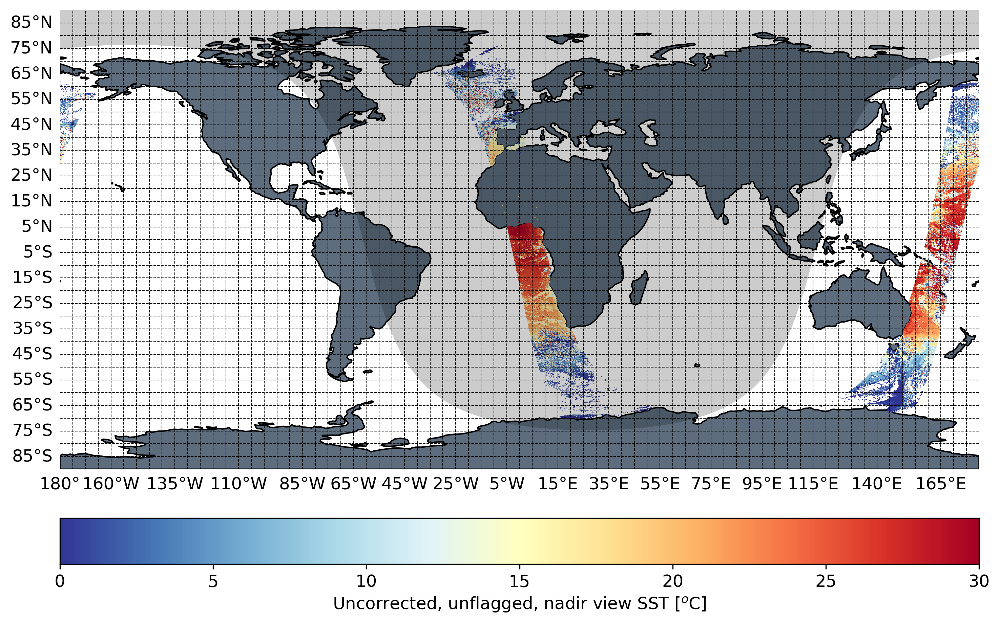

In [13]:
# define the figure
fig = plt.figure(figsize=(10, 10), dpi=300)
m = plt.subplot(projection=cartopy.crs.PlateCarree())
m.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='k', facecolor='#5D6D7E')
m.set_global()

# issues with +/- 180 unless you do this.
shift_lon = np.array(band_vars["lon"][::grid_reduce, ::grid_reduce])
ii = np.where(shift_lon < 0.0)
shift_lon[ii] = shift_lon[ii] + 360.0

# make the plot itself
p1 = m.pcolormesh(shift_lon, band_vars["lat"][::grid_reduce, ::grid_reduce],
                  band_vars["sea_surface_temperature"][0, ::grid_reduce, ::grid_reduce] - k_to_c,
                  transform=cartopy.crs.PlateCarree(central_longitude=0.0), 
                  cmap=plt.cm.RdYlBu_r, zorder=1, vmin=0, vmax=30)

# Embellish with gridlines
g1 = m.gridlines(draw_labels = True, zorder=20, color='0.0', linestyle='--',linewidth=0.5)
g1.xlocator = mticker.FixedLocator(np.arange(-180, 180, 5))
g1.ylocator = mticker.FixedLocator(np.arange(-90, 90, 5))
g1.top_labels = False
g1.right_labels = False
g1.xlabel_style = {'color': 'black'}
g1.ylabel_style = {'color': 'black'}
m.set(facecolor = "1.0")
m.axis('off')

# set the "night shadow"
m.add_feature(Nightshade(avg_date, alpha=0.2))

# create the colour bar
cbar = fig.colorbar(p1, location='bottom', pad=0.05)
cbar.set_label('Uncorrected, unflagged, nadir view SST [$^{o}$C]')
plt.tight_layout()


 Here we have our first full-orbit plot of bias-uncorrected, nadir view SST with no flagging applied. Later on in this notebook we will consider how to correct for bias, isolate only the dual view SST and apply quality flags. First, though, lets zoom in on a two areas; the Gulf of Cadiz and the East Australian Current. We define regions of interest (ROIs) for these below.

In [14]:
# look at two smaller areas; Gulf of Cadiz (GoC) and East Australian Current (EAC)
coords = {}
coords["GoC"] = {}
coords["GoC"]["name"] = "Gulf of Cadiz"
coords["GoC"]["lons"] = [-10.0, 0.0,  0.0, -10.0, -10.0]
coords["GoC"]["lats"] = [30.0, 30.0, 40.0,  40.0,  30.0]

coords["EAC"] = {}
coords["EAC"]["name"] = "East Australian Current"
coords["EAC"]["lons"] = [150.0, 160.0, 160.0, 150.0, 150.0]
coords["EAC"]["lats"] = [-37.5, -37.5, -27.5, -27.5, -37.5]

for item in coords:
    coords[item]["x"], coords[item]["y"], mask = eumartools.subset_image(np.array(band_vars["lon"]),
                                                                         np.array(band_vars["lat"]),
                                                                         coords[item]["lons"],
                                                                         coords[item]["lats"])

 Now we can make smaller plots of our ROIs. This will help us look at some specific structures as well as highlight more clearly some issues with the data that we need to address.

Plotting Gulf of Cadiz
Plotting East Australian Current


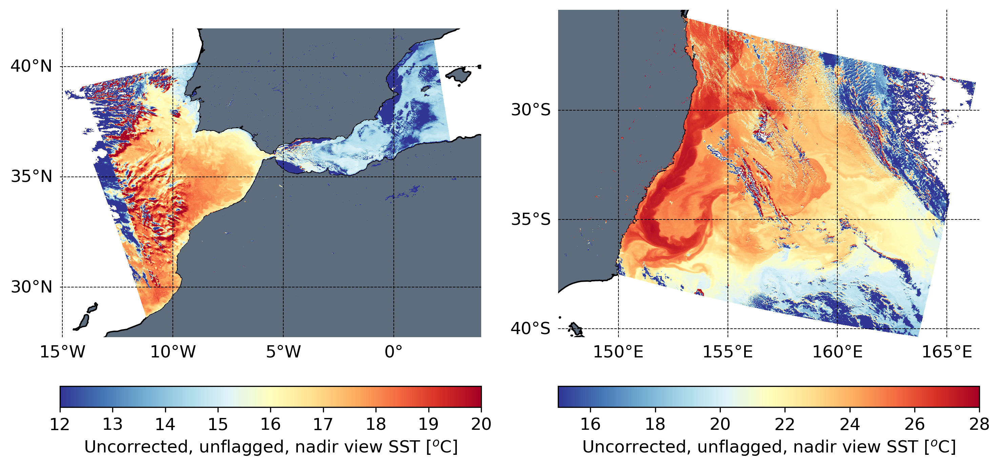

In [15]:
fig, axs = plt.subplots(1, 2, figsize=(10, 10), dpi=300, subplot_kw={"projection": cartopy.crs.PlateCarree()})

for m, loc, vmin, vmax in zip(axs, coords, [12, 15], [20, 28]):
    print(f"Plotting {coords[loc]['name']}")
    
    # setting "x" to use full swath width
    minx = 0 ; maxx = np.shape(band_vars["lon"])[-1]
    miny = min(coords[loc]["y"]) ; maxy = max(coords[loc]["y"])
    
    m.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='k', facecolor='#5D6D7E')
    pvar = band_vars["sea_surface_temperature"][0, miny:maxy, minx:maxx] - k_to_c
    p1 = slstr_plot(m, band_vars, pvar, [minx, maxx, miny, maxy, vmin, vmax], cmap=plt.cm.RdYlBu_r)

    cbar = fig.colorbar(p1, ax=m, location='bottom', pad=0.05)
    cbar.set_label('Uncorrected, unflagged, nadir view SST [$^{o}$C]')

plt.tight_layout()


SLSTR has 5 retrieval algorithms for sea surface temperature. The algorithms are named for the viewing geometry they use, as well as the number of brightness temperature bands they use. Consequently, we have;
- N2 - which uses only the nadir view and the S8 and S9 channels.
- N3 - which uses only the nadir view and the S7, S8 and S9 channels.
- N3R - which uses only the nadir view and the S7, S8 and S9 channels, and is designed for regions with high aerosol content.
- D2 - which uses the nadir and oblique dual views and the S8 and S9 channels.
- D3 - which uses the nadir and oblique dual views and the S7, S8 and S9 channels.

We can see what algorithms were used to retrieve the SST across our regions of interest. We will plot these using the code in the box below.

Plotting Gulf of Cadiz
Plotting East Australian Current


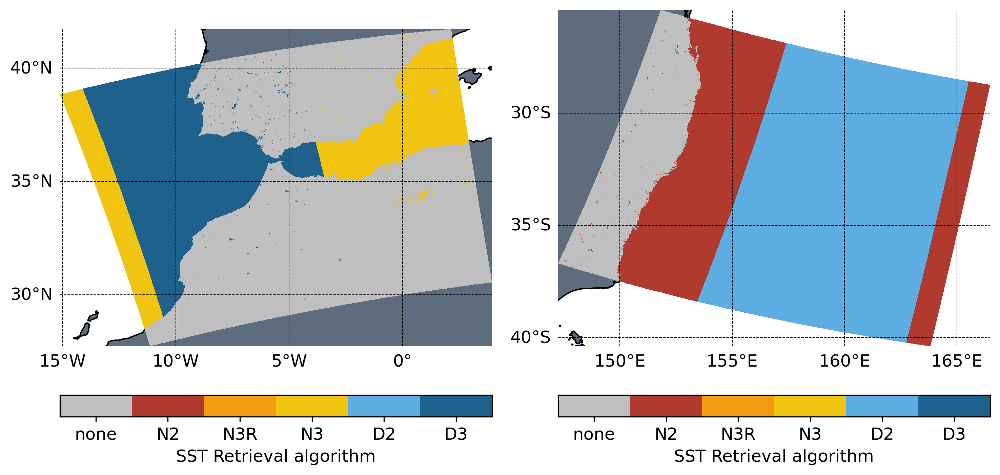

In [16]:
fig, axs = plt.subplots(1, 2, figsize=(10, 10), dpi=300, subplot_kw={"projection": cartopy.crs.PlateCarree()})

for m, loc, vmin, vmax in zip(axs, coords , [0, 0], [6, 6]):
    print(f"Plotting {coords[loc]['name']}")

    # setting "x" to use full swath width
    minx = 0 ; maxx = np.shape(band_vars["lon"])[-1]
    miny = min(coords[loc]["y"]) ; maxy = max(coords[loc]["y"])
    
    m.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='k', facecolor='#5D6D7E')
    pvar = band_vars["sst_algorithm_type"][0, miny:maxy, minx:maxx]
    p1 = slstr_plot(m, band_vars, pvar, [minx, maxx, miny, maxy, vmin, vmax], cmap=cmap)

    cbar = fig.colorbar(p1, ax=m, location='bottom', pad=0.05)
    cbar.set_label('SST Retrieval algorithm')
    cbar.set_ticks([0.5, 1.5, 2.5, 3.5, 4.5, 5.5])
    cbar.set_ticklabels(['none', 'N2', 'N3R', 'N3', 'D2', 'D3'])
    
plt.tight_layout()

 We know, from previous notebooks that the S7 channel becomes contaminated by solar reflectance in the day. Therefore, we use the N3 and D3 algorithms at night (as seen on the left across the GoC), and the N2 and D2 algorithms in the day (as shown in the right over the EAC). In most cases, dual view offers the highest quality data as we are able to better characterise and correct for the atmosphere when we consider both geometries. However, the oblique view is not as wide as the nadir view, so we use N3 and N2 are used at the edges of the swath.

## 5. Understanding single sensor error statistics

 Single sensor error statistics (SSES) give us information about the standard deviation and bias of each pixel in a scene. The bias value is derived from comparisons with in situ data, and depends on both the quality of the data and the retrieval algorithm used. We can correct for the bias by using the sses_bias field present in the level-2 product. We will plot this using the code below.

Plotting Gulf of Cadiz
Plotting East Australian Current


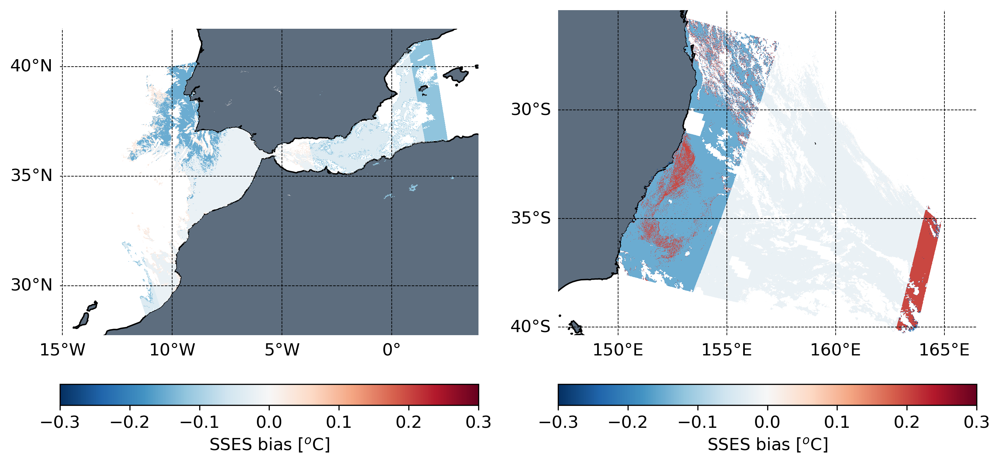

In [17]:
fig, axs = plt.subplots(1, 2, figsize=(10, 10), dpi=300, subplot_kw={"projection": cartopy.crs.PlateCarree()})

for m, loc, vmin, vmax in zip(axs, coords , [-0.3, -0.3], [0.3, 0.3]):
    print(f"Plotting {coords[loc]['name']}")

    # setting "x" to use full swath width
    minx = 0 ; maxx = np.shape(band_vars["lon"])[-1]
    miny = min(coords[loc]["y"]) ; maxy = max(coords[loc]["y"])
    
    pvar = band_vars["sses_bias"][0, miny:maxy, minx:maxx]
    m.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='k', facecolor='#5D6D7E')
    p1 = slstr_plot(m, band_vars, pvar, [minx, maxx, miny, maxy, vmin, vmax], cmap=plt.cm.RdBu_r)
    
    cbar = fig.colorbar(p1, ax=m, location='bottom', pad=0.05)
    cbar.set_label('SSES bias [$^{o}$C]')

plt.tight_layout()


## 6. Understanding quality levels and applying flags

 The quality of each pixel in an SLSTR level-2 scene is assessed on a scale of 0 (worst) to 5 (best). Cloud, high aerosol content and poor retrieval algorithm performance all influence the quality level. Usually, it is good practice to use only quality level-5 data, though this can occasionally be relaxed to quality level-4 and above in certain circumstances. We can use the quality_level field to check for reliable pixels in our scene, as below.

Plotting Gulf of Cadiz
Plotting East Australian Current


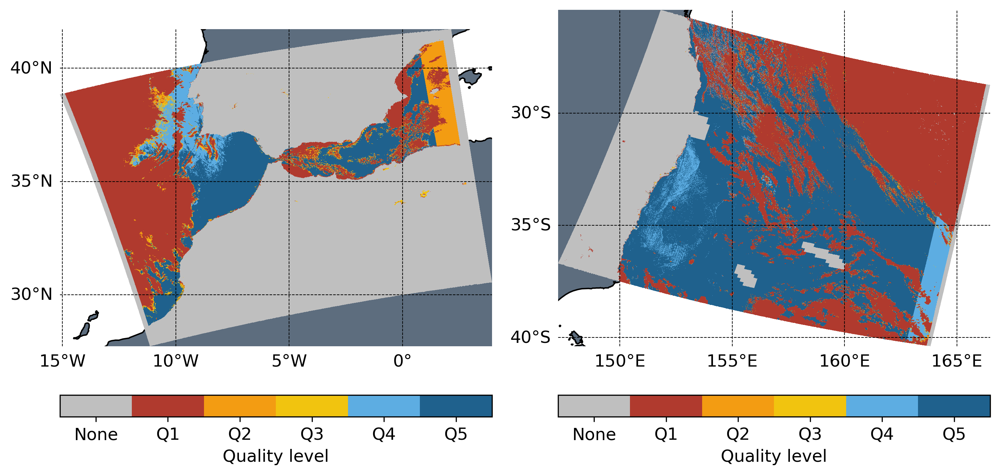

In [18]:
fig, axs = plt.subplots(1, 2, figsize=(10, 10), dpi=300, subplot_kw={"projection": cartopy.crs.PlateCarree()})

for m, loc, vmin, vmax in zip(axs, coords , [0, 0], [6, 6]):
    print(f"Plotting {coords[loc]['name']}")

    # setting "x" to use full swath width
    minx = 0 ; maxx = np.shape(band_vars["lon"])[-1]
    miny = min(coords[loc]["y"]) ; maxy = max(coords[loc]["y"])

    pvar = band_vars["quality_level"][0, miny:maxy, minx:maxx]
    m.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='k', facecolor='#5D6D7E')
    p1 = slstr_plot(m, band_vars, pvar, [minx, maxx, miny, maxy, vmin, vmax], cmap=cmap)

    cbar = fig.colorbar(p1, ax=m, location='bottom', pad=0.05)
    cbar.set_label('Quality level')
    cbar.set_ticks([0.5, 1.5, 2.5, 3.5, 4.5, 5.5])
    cbar.set_ticklabels(['None','Q1','Q2','Q3','Q4','Q5'])
    
plt.tight_layout()

We can clearly see that significant parts of our scene are poor quality, likely due to cloud in this case (Q1). A quality value of "None" is given over land. We also have some lose some data from the eastern side of our GoC scene, likely due to the viewing geometry. If you compare the patterns in the quality level with the sses bias we previously looked at, you can see that one echoes the other as the bias and quality level are linked.

  
## 7. Bringing it all together

Finally, we can bring everything we know about SST quality together. Our highest quality SST is:
- measured at night (where possible)
- dual viewbias corrected
- quality level 5

Lets apply all these factors together and see what data remains (but also plot the day scene for interest).

Plotting Gulf of Cadiz
Plotting East Australian Current


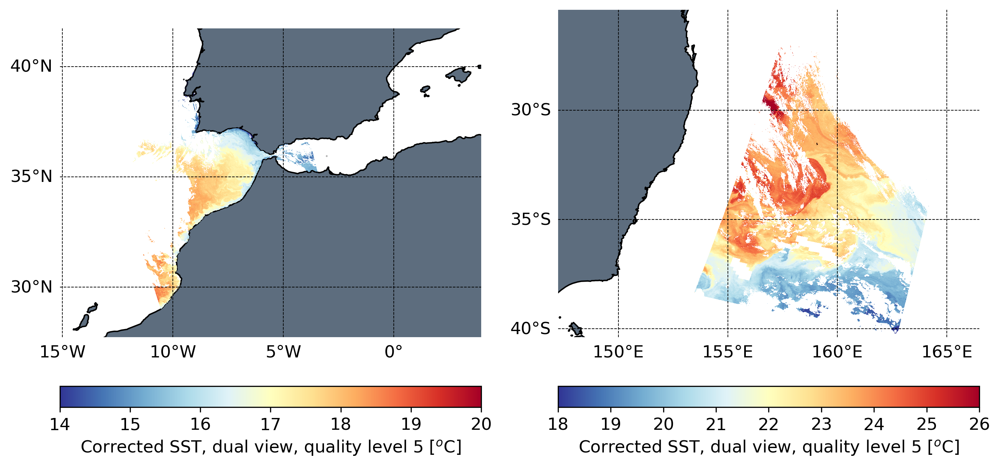

In [19]:
fig, axs = plt.subplots(1, 2, figsize=(10, 10), dpi=300, subplot_kw={"projection": cartopy.crs.PlateCarree()})

for m, loc, vmin, vmax in zip(axs, coords, [14, 18], [20, 26]):
    print(f"Plotting {coords[loc]['name']}")

    # setting "x" to use full swath width
    minx = 0 ; maxx = np.shape(band_vars["lon"])[-1]
    miny = min(coords[loc]["y"]) ; maxy = max(coords[loc]["y"])

    SST = band_vars["sea_surface_temperature"][0, miny:maxy, minx:maxx]
    BIAS = band_vars["sses_bias"][0, miny:maxy, minx:maxx]
    ALGORITHM = band_vars["sst_algorithm_type"][0, miny:maxy, minx:maxx]
    QUAL = band_vars["quality_level"][0, miny:maxy, minx:maxx]
    
    remove_pixels = np.where((ALGORITHM < 4) | (QUAL < 5))
    FINAL_SST = np.array((SST + BIAS) - k_to_c)
    FINAL_SST[remove_pixels] = np.nan
    
    m.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='k', facecolor='#5D6D7E')
    p1 = slstr_plot(m, band_vars, FINAL_SST, [minx, maxx, miny, maxy, vmin, vmax], cmap=plt.cm.RdYlBu_r)

    cbar = fig.colorbar(p1, ax=m, location='bottom', pad=0.05)
    cbar.set_label('Corrected SST, dual view, quality level 5 [$^{o}$C]')
    
plt.tight_layout()


# Search the collection <a class="anchor" id="search"></a>

Some of my code now

Sentinel-3 product file names follow a specific convention: 

`MMM_SL_L_TTTTTT_yyyymmddThhmmss_YYYYMMDDTHHMMSS_YYYYMMDDTHHMMSS_[instance ID].SEN3. `

Here's a breakdown of each component: 
- MMM: Mission ID (e.g., S3A, S3B for Sentinel-3A and Sentinel-3B respectively).
- SL: Data source/consumer (e.g., SL for SLSTR).
- L: Processing level (0 for Level-0, 1 for Level-1, 2 for Level-2).
- TTTTTT: Data Type ID (e.g., SLT for SLSTR Level-0, RBT for Level-1, WCT, WST, LST, FRP for Level-2).
- yyyymmddThhmmss: Sensing start time (ISO 8601 format).
- YYYYMMDDTHHMMSS: Sensing stop time (ISO 8601 format).
- YYYYMMDDTHHMMSS: Product creation date.
- [instance ID]: A unique 17-character identifier.
- .SEN3: Filename extension.

`instance ID` is DDDD_CCC_LLL_FFFF:
- DDDD: Duration of the sensing interval in seconds.
- CCC: Cycle number at the sensing start time.
- LLL: Relative orbit number.
- FFFF: Frame number.

In [1]:
import cartopy                                    # a library that support mapping
from   cartopy.feature.nightshade import Nightshade # a library that helps plot day/night cycles
import datetime                                   # a library that supports time and dat objects
import glob                                       # a library that aids in searching for files
import matplotlib.pyplot as plt                   # a library that support plotting
import matplotlib.ticker as mticker               # a library that extends plotting support
from   matplotlib.colors import ListedColormap      # a library that extends plotting support
import numpy as np                                # a library that provides support for array-based mathematics
import os                                         # a library that allows us access to basic operating system commands
import warnings                                   # a library that helps us manage warnings
import xarray as xr                               # a library that supports the use of multi-dimensional arrays in Python
import xml.etree.ElementTree as ET                # a library that helps us parse XML files
import eumartools                                 # a EUMETSAT library that support working with Sentinel-3 products
import eumdac 
from   datetime import datetime
import eumetsat_tools_uwa

warnings.filterwarnings('ignore')

import eumetsat_tools_uwa
token = eumetsat_tools_uwa.login()
slstr_plot = eumetsat_tools_uwa.slstr_plot

collection_id = 'EO:EUM:DAT:0412' # Level 2

datastore = eumdac.DataStore(token)

selected_collection = datastore.get_collection(collection_id)

collection = selected_collection

# Define search parameters
start = datetime(2025, 3, 25)
end = datetime(2025, 3, 28)

bbox = {"west": 27.564697, "south": 34.764179, "east": 33.002930, "north": 37.387617} # Scott reef
bbox = '120., -15.5, 125., -12' # Scott Reef
bbox = '110., -24., 115., -21.' # Exmouth

# Perform search
products = collection.search(
    dtstart=start,
    dtend=end,
    bbox=bbox,
    timeliness='NT'
#     # Optional: refine with bounding box, product type, etc.
)

# Print titles of found products
print('Generatng list')
product_list = [product.metadata['properties']['title'] for product in products]
print('....list done')

/mnt/c/Users/00071913/OneDrive - UWA/Zulberti/git_repos_other/mnf_ningaloo_2026/NOTEBOOKS/eumetsat_tools_uwa.py:50: SyntaxWarning: invalid escape sequence '\<'
  """


This token 'e196cce7-6072-36a7-8c0a-b94b5692193c' expires 2025-05-25 14:59:18.377730
Generatng list
....list done


In [3]:
for product_id in product_list:

    print(product_id)
    

S3A_SL_2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
S3B_SL_2_WST____20250327T140213_20250327T154313_20250328T204621_6059_104_352______MAR_O_NT_003.SEN3
S3A_SL_2_WST____20250327T011307_20250327T025406_20250328T074817_6059_124_102______MAR_O_NT_003.SEN3
S3B_SL_2_WST____20250327T003420_20250327T021519_20250328T071717_6059_104_344______MAR_O_NT_003.SEN3
S3A_SL_2_WST____20250326T150712_20250326T164811_20250327T210325_6059_124_096______MAR_O_NT_003.SEN3
S3B_SL_2_WST____20250326T142824_20250326T160924_20250327T194632_6059_104_338______MAR_O_NT_003.SEN3
S3B_SL_2_WST____20250326T010031_20250326T024130_20250327T064337_6059_104_330______MAR_O_NT_003.SEN3
S3B_SL_2_WST____20250325T145435_20250325T163535_20250326T200314_6059_104_324______MAR_O_NT_003.SEN3
S3A_SL_2_WST____20250325T002429_20250325T020528_20250326T070041_6059_124_073______MAR_O_NT_003.SEN3


In [4]:
i = 0
product_id=product_list[i]
selected_product = datastore.get_product(product_id=product_id, collection_id=collection_id)


In [5]:
product_details = eumetsat_tools_uwa.parse_product_name(product_id)


S3A_SL_2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
SL_2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
6059_124_110______MAR_O_NT_003.SEN3
124_110______MAR_O_NT_003.SEN3
110______MAR_O_NT_003.SEN3
_____MAR_O_NT_003.SEN3
MAR_O_NT_003.SEN3
O_NT_003.SEN3
NT_003.SEN3
003.SEN3


In [6]:
download_dir = '../DATA'

with selected_product.open() as fsrc, open(os.path.join(download_dir, fsrc.name), mode='wb') as fdst:
    if os.path.exists(os.path.join(download_dir, fsrc.name)[0:-4]):
        print(f'Unzipped directory {os.path.join(download_dir, fsrc.name)[0:-4]} already exists.')
    else:
        print(f'Downloading {fsrc.name}')
        shutil.copyfileobj(fsrc, fdst)
        print(f'Download of product {fsrc.name} finished.')

        with zipfile.ZipFile(fdst.name, 'r') as zip_ref:
            for file in zip_ref.namelist():
                if file.startswith(str(selected_product)):
                    zip_ref.extract(file, download_dir)
            print(f'Unzipping of product {selected_product} finished.')
    
        os.remove(fdst.name)
        print(f'Deleting {fdst.name} finished.')

SAFE_directory = fdst.name[0:-4] # Drop the zip
SAFE_directory

os.listdir(SAFE_directory)


Unzipped directory ../DATA/S3A_SL_2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3 already exists.


['.png.png',
 '20250327144101-MAR-L2P_GHRSST-SSTskin-SLSTRA-20250328204307-v02.0-fv01.0.nc',
 'xfdumanifest.xml']

In [7]:
# look at two smaller areas; Gulf of Cadiz (GoC) and East Australian Current (EAC)
coords = {}
coords["EX"] = {}
coords["EX"]["name"] = "Exmouth"
coords["EX"]["lons"] = [112.5,  115., 115.,  112.5, 112.5]
coords["EX"]["lats"] = [-21., -21., -23. , -23., -21., ]


In [8]:

band_vars, sst_dtime = eumetsat_tools_uwa.load_SAFE_directory_nc(SAFE_directory)

    

Loading SAFE directory: ../DATA/S3A_SL_2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
no dask
scale_factor: 0.1
add_offset: 3200.0
fill_value: -32768
masked
scaled
Data returned


In [9]:
SAFE_manifest = glob.glob(os.path.join(SAFE_directory, 'xfd*.xml'))[0]

tree = ET.parse(SAFE_manifest)
root = tree.getroot()

acq_start = root.findall('.//sentinel-safe:startTime', {'sentinel-safe':'http://www.esa.int/safe/sentinel/1.1'})
acq_stop = root.findall('.//sentinel-safe:stopTime', {'sentinel-safe':'http://www.esa.int/safe/sentinel/1.1'})

t1 = datetime.strptime(acq_start[0].text, "%Y-%m-%dT%H:%M:%S.%fZ")
t2 = datetime.strptime(acq_stop[0].text, "%Y-%m-%dT%H:%M:%S.%fZ")

avg_date = t1 + (t2-t1) / 2


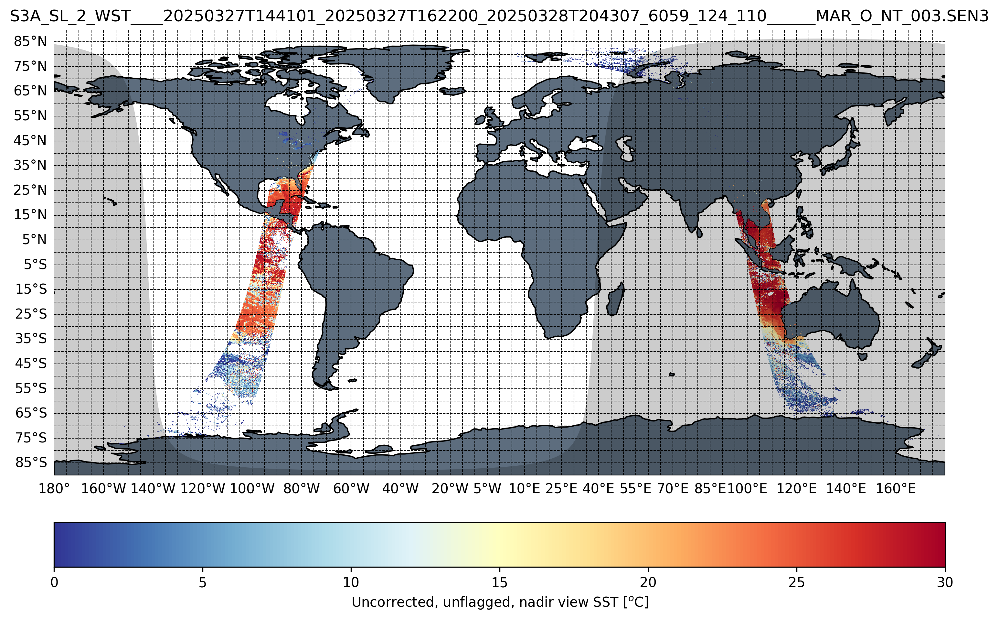

In [10]:
# grid sub-sampling parameter
grid_reduce = 5

# Kelvin to Celsius conversion
k_to_c = 273.15

# define the figure
fig = plt.figure(figsize=(10, 10), dpi=300)
m = plt.subplot(projection=cartopy.crs.PlateCarree())
m.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='k', facecolor='#5D6D7E')
m.set_global()

# issues with +/- 180 unless you do this.
shift_lon = np.array(band_vars["lon"][::grid_reduce, ::grid_reduce])
ii = np.where(shift_lon < 0.0)
shift_lon[ii] = shift_lon[ii] + 360.0

# make the plot itself
p1 = m.pcolormesh(shift_lon, band_vars["lat"][::grid_reduce, ::grid_reduce],
                  band_vars["sea_surface_temperature"][0, ::grid_reduce, ::grid_reduce] - k_to_c,
                  transform=cartopy.crs.PlateCarree(central_longitude=0.0), 
                  cmap=plt.cm.RdYlBu_r, zorder=1, vmin=0, vmax=30)

# Embellish with gridlines
g1 = m.gridlines(draw_labels = True, zorder=20, color='0.0', linestyle='--',linewidth=0.5)
g1.xlocator = mticker.FixedLocator(np.arange(-180, 180, 5))
g1.ylocator = mticker.FixedLocator(np.arange(-90, 90, 5))
g1.top_labels = False
g1.right_labels = False
g1.xlabel_style = {'color': 'black'}
g1.ylabel_style = {'color': 'black'}
m.set(facecolor = "1.0")
m.axis('off')

# set the "night shadow"
m.add_feature(Nightshade(avg_date, alpha=0.2))

# create the colour bar
cbar = fig.colorbar(p1, location='bottom', pad=0.05)
cbar.set_label('Uncorrected, unflagged, nadir view SST [$^{o}$C]')

plt.title(fsrc.name[0:-4])

plt.tight_layout()

figname =  os.path.join(download_dir, fsrc.name[0:-4], '.png')

plt.savefig(figname, dpi=300)

In [ ]:
item = 'EX'
coords[item]["x"], coords[item]["y"], mask = eumartools.subset_image(np.array(band_vars["lon"]),
                                                                     np.array(band_vars["lat"]),
                                                                     coords[item]["lons"],
                                                                     coords[item]["lats"])

Plotting Exmouth
Saving_fig


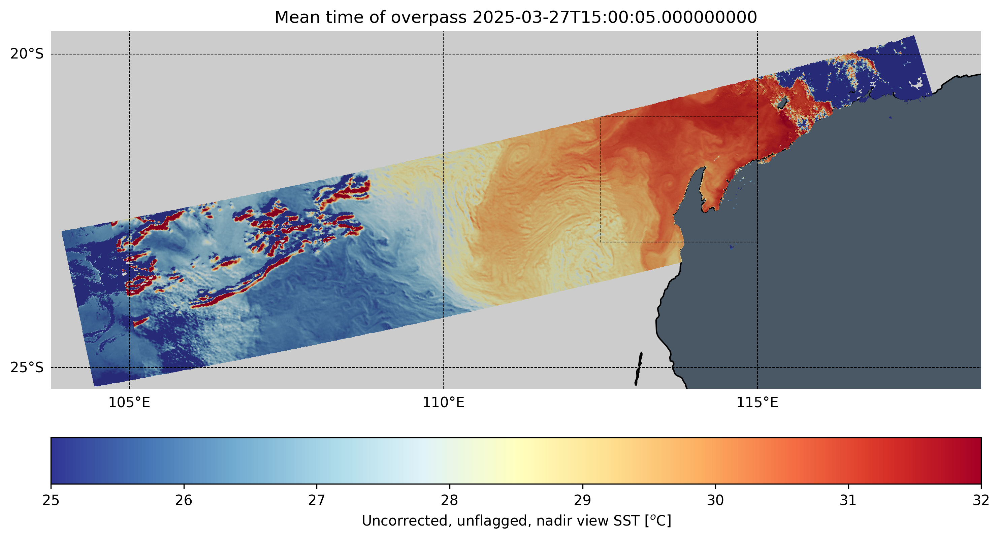

In [ ]:
import pandas as pd

def make_plot(coords, band_vars, sst_dtime):

    fig_dir = '../FIGS/SENTINEL3'

    nc = len(coords)
    fig, axs = plt.subplots(1, nc, figsize=(10, 10), dpi=300, subplot_kw={"projection": cartopy.crs.PlateCarree()})

    if nc == 1:
        axs = [axs]

    vmins = [12, 15]
    vmaxs = [20, 28]

    vmins = [25]
    vmaxs = [32]

    for m, loc, vmin, vmax in zip(axs, coords, vmins, vmaxs):

        myfigdir = os.path.join(fig_dir, loc)
        if not os.path.exists(myfigdir):
            os.makedirs(myfigdir)

        print(f"Plotting {coords[loc]['name']}")
        
        # setting "x" to use full swath width
        minx = 0 ; maxx = np.shape(band_vars["lon"])[-1]
        miny = min(coords[loc]["y"]) ; maxy = max(coords[loc]["y"])
        
        m.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='k', facecolor='#5D6D7E')
        
        pvar = band_vars["sea_surface_temperature"][0, miny:maxy, minx:maxx] - k_to_c

        # dtimevar = band_vars["sst_dtime"][0, miny:maxy, minx:maxx]
        dtimevar = sst_dtime[0, miny:maxy, minx:maxx]
        
        pass_length = np.nanmax(dtimevar) - np.nanmin(dtimevar)
        mean_timedelta = np.nanmean(dtimevar)
        mean_timedelta = np.timedelta64(int(mean_timedelta), 's')
        mean_time = band_vars.time.values[0] + mean_timedelta
        
        mean_time_str = str(mean_time).replace('T', ' ').replace(':', '_').replace('.', '_')
        p1 = slstr_plot(m, band_vars, pvar, [minx, maxx, miny, maxy, vmin, vmax], cmap=plt.cm.RdYlBu_r)

        cbar = fig.colorbar(p1, ax=m, location='bottom', pad=0.05)
        cbar.set_label('Uncorrected, unflagged, nadir view SST [$^{o}$C]')

        m.set_title(f"Mean time of overpass {mean_time}")

        py_dt = pd.to_datetime(mean_time).to_pydatetime()
        m.add_feature(Nightshade(py_dt, alpha=0.2))

        m.plot(coords[loc]["lons"], coords[loc]["lats"], 'k--', alpha=0.5, lw=0.5, zorder=10)

        plt.tight_layout()

        print('Saving_fig')
        pvar.attrs['mean_t_over_box_str']   = mean_time_str
        pvar.attrs['total_t_over_box_seconds']   = pass_length

        pvar.attrs = band_vars.attrs
        pvar = pvar.drop_vars('time') 
        pvar.to_netcdf(os.path.join(myfigdir, f"SST{mean_time_str}.nc"))

        fig.savefig(os.path.join(myfigdir, f"SST{mean_time_str}.png"))

        return pvar
    
pvar = make_plot(coords, band_vars, sst_dtime)


# Run production scale <a class="anchor" id="production"></a>


S3A_SL_2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
SL_2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
6059_124_110______MAR_O_NT_003.SEN3
124_110______MAR_O_NT_003.SEN3
110______MAR_O_NT_003.SEN3
_____MAR_O_NT_003.SEN3
MAR_O_NT_003.SEN3
O_NT_003.SEN3
NT_003.SEN3
003.SEN3
Unzipped directory already exists ../DATA/S3A_SL_2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3 
Getting data 2025-05-24 15:30:02
Loading SAFE directory: ../DATA/S3A_SL_2_WST____20250327T144101_202503

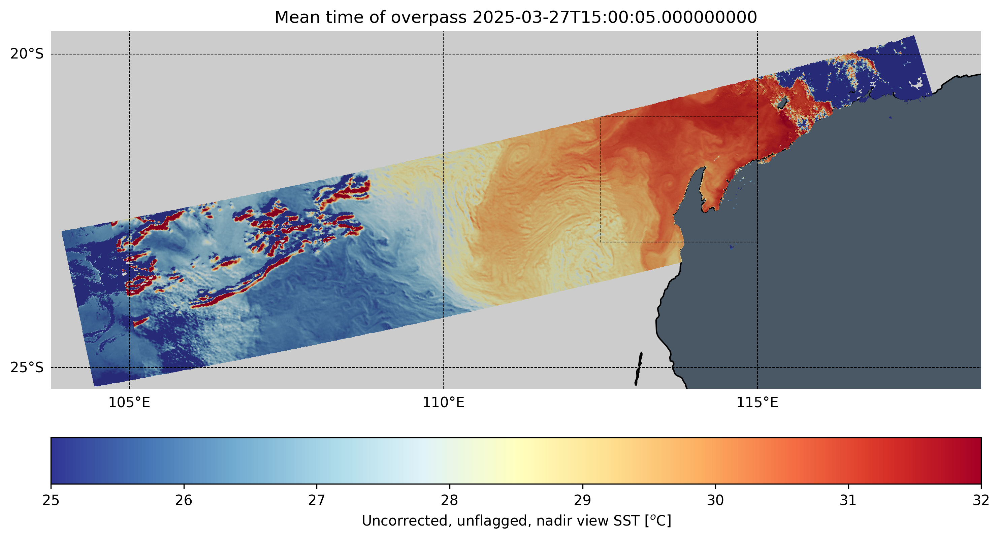

PLOT DONE 2025-05-24 15:30:29
S3A_SL_2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
SL_2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
6059_124_110______MAR_O_NT_003.SEN3
124_110______MAR_O_NT_003.SEN3
110______MAR_O_NT_003.SEN3
_____MAR_O_NT_003.SEN3
MAR_O_NT_003.SEN3
O_NT_003.SEN3
NT_003.SEN3
003.SEN3
Unzipped directory already exists ../DATA/S3A_SL_2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3 
Getting data 2025-05-24 15:30:30
Loading SAFE directory: ../DATA/S3A_SL_2

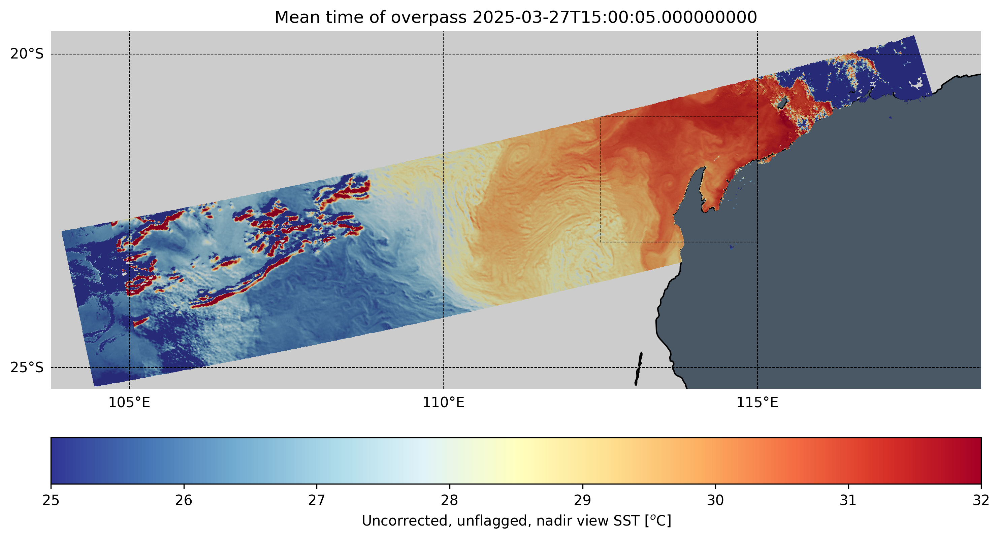

PLOT DONE 2025-05-24 15:30:56
S3A_SL_2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
SL_2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
20250328T204307_6059_124_110______MAR_O_NT_003.SEN3
6059_124_110______MAR_O_NT_003.SEN3
124_110______MAR_O_NT_003.SEN3
110______MAR_O_NT_003.SEN3
_____MAR_O_NT_003.SEN3
MAR_O_NT_003.SEN3
O_NT_003.SEN3
NT_003.SEN3
003.SEN3
Unzipped directory already exists ../DATA/S3A_SL_2_WST____20250327T144101_20250327T162200_20250328T204307_6059_124_110______MAR_O_NT_003.SEN3 
Getting data 2025-05-24 15:30:57
Loading SAFE directory: ../DATA/S3A_SL_2

In [ ]:

for product_id in product_list[0::]:

    product_id=product_list[i]
    selected_product = datastore.get_product(product_id=product_id, collection_id=collection_id)

    product_details = eumetsat_tools_uwa.parse_product_name(product_id)

    with selected_product.open() as fsrc, open(os.path.join(download_dir, fsrc.name), mode='wb') as fdst:
        if os.path.exists(os.path.join(download_dir, fsrc.name)[0:-4]):
            print(f'Unzipped directory already exists {os.path.join(download_dir, fsrc.name)[0:-4]} ')
        else:
            print(f'Downloading {fsrc.name}')
            shutil.copyfileobj(fsrc, fdst)
            print(f'Download of product {fsrc.name} finished.')

            with zipfile.ZipFile(fdst.name, 'r') as zip_ref:
                for file in zip_ref.namelist():
                    if file.startswith(str(selected_product)):
                        zip_ref.extract(file, download_dir)
                print(f'Unzipping of product {selected_product} finished.')
        
            os.remove(fdst.name)
            print(f'Deleting {fdst.name} finished.')

    SAFE_directory = fdst.name[0:-4] # Drop the zip
    SAFE_directory

    os.listdir(SAFE_directory)

    print('Getting data', datetime.now().strftime('%Y-%m-%d %H:%M:%S'))
    # band_vars, sst_dtime = get_data(SAFE_directory)
    
    band_vars, sst_dtime = eumetsat_tools_uwa.load_SAFE_directory_nc(SAFE_directory)

    print('Subsetting data', datetime.now().strftime('%Y-%m-%d %H:%M:%S'))

    for item in ['EX']:
        coords[item]["x"], coords[item]["y"], mask = eumartools.subset_image(np.array(band_vars["lon"]),
                                                                            np.array(band_vars["lat"]),
                                                                            coords[item]["lons"],
                                                                            coords[item]["lats"])
        
    print('Subsetting complete', datetime.now().strftime('%Y-%m-%d %H:%M:%S'))

    print('Making plot data')    
    pvar = make_plot(coords, band_vars, sst_dtime)
    plt.show()

    print('PLOT DONE', datetime.now().strftime('%Y-%m-%d %H:%M:%S'))

                                                                         